# PROPAGACIÓN DE ERRORES

Para la propagación de errores, es necesario conocer la sensibilidad de los parámetros U y Q. Para su cálculo, se utilizará la siguiente ecuación:

$$
\sigma=\frac{\sigma _0}{\sqrt{N_{hits}}}
$$

sea $ \sigma _0 $ la sensibilidad característica de cada una de las bocinas para las distintas frecuencias con las que trabajamos:

<p align="center"> 
<img src="/home/marina/TFG/image.png" alt="Characteristic value of the sensitivity for each channel" width="400"> <br> 
<em>Source: <a href="https://academic.oup.com/mnras/article/519/3/3383/6982878">QUIJOTE scientific results – IV. A northern sky survey in intensity and polarization at 10–20 GHz with the multifrequency instrument
</a></em> </p>

**Explicación unidades**: La ley fundamental del ruido radiométrico (o ruido térmico) establece que la incertidumbre estadística en la medida disminuye cuando integras durante más tiempo.

/tmp/ipykernel_687/3206016751.py:15: RuntimeWarning: invalid value encountered in sqrt
  sigQ = sig0 / np.sqrt(hitsQ)


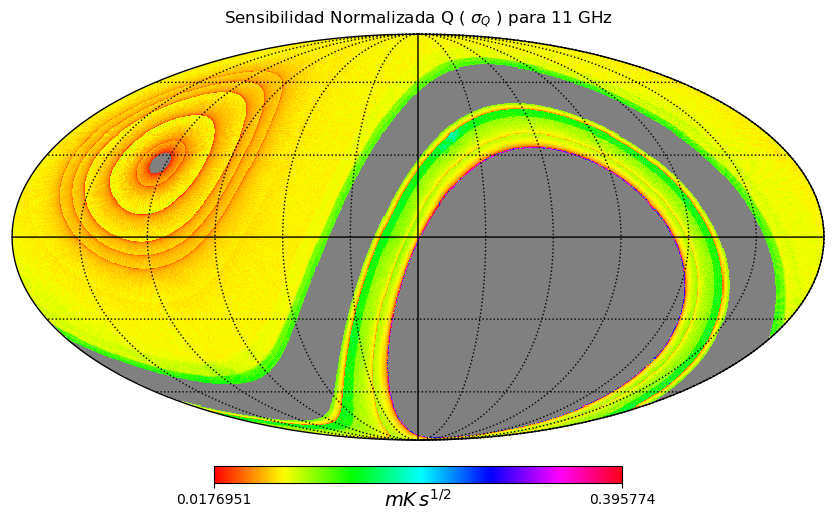

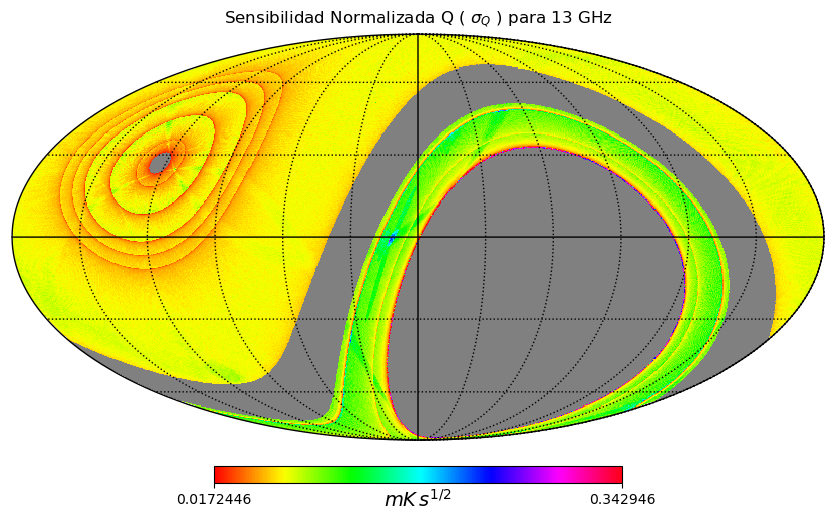

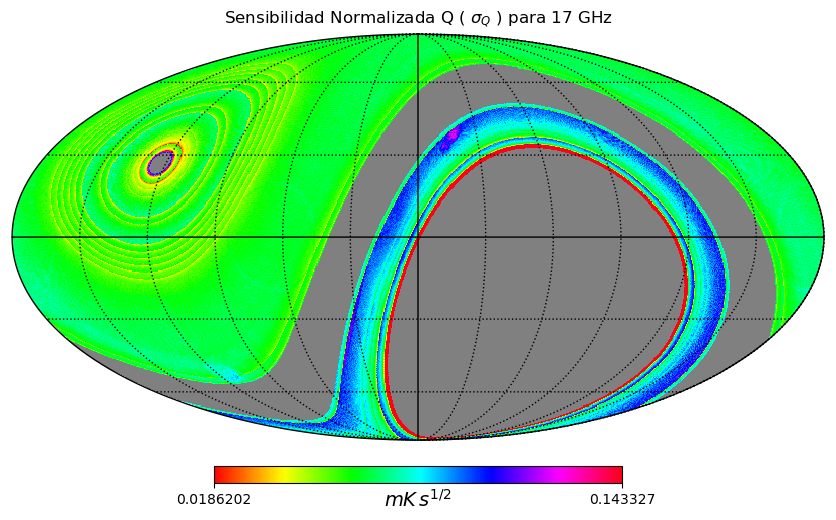

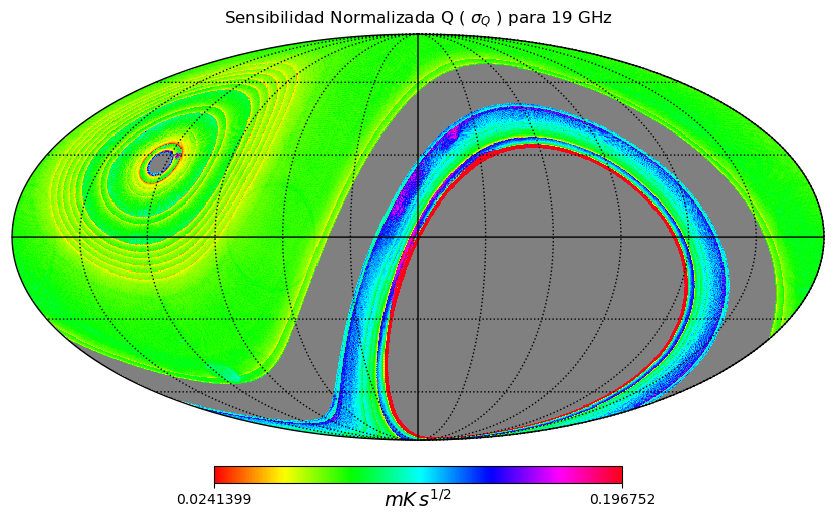

In [11]:
%matplotlib inline

import healpy as hp
import numpy as np
import matplotlib.pyplot as plt

##############################################################################
# BLOQUE 1: SENSIBILIDAD NORMALIZADA PARA Q
##############################################################################

def normsigQ(sig0, hitsQ):

    """Calcula la sensibilidad normalizada para Q"""
    
    sigQ = sig0 / np.sqrt(hitsQ)
    return sigQ

# Creación de un diccionario donde introducimos los valores de sensibilidad característica (sig0Q) para Q

sig0Q_values = {
    11: 1.371,                # 11 GHz => H3
    13: 1.188,                # 13 GHz => H3
    17: (1.878 + 1.101) / 2,  # 17 GHz => promedio H2, H4
    19: (2.280 + 1.059) / 2   # 19 GHz => promedio H2, H4
}

frecuencias = [11, 13, 17, 19]
sensQ_maps = {}  # Diccionario donde almacenaremos los mapas resultantes

for freq in frecuencias:
    archivo = f"quijote_mfi_smth_skymap_{freq}ghz_512_dr1.fits"
    
    # Lectura de la sensibilidad característica para Q

    sig0Q = sig0Q_values[freq]
    
    # Carga el mapa de hits para Q, U

    hitsQU = hp.read_map(archivo, field=4)
    
    # Cálculo de la sensibilidad normalizada llamando a la función definida previamente

    sigQ_norm = normsigQ(sig0Q, hitsQU)
    
    # Guarda en el diccionario para cada iteracción (frecuencia)

    sensQ_maps[freq] = sigQ_norm

# Definición de una función para graficar los mapas de sensibilidad normalizada

def plot_map_Q(map_data, freq):
    hp.mollview(
        map_data, 
        title=f'Sensibilidad Normalizada Q ( $\sigma_Q$ ) para {freq} GHz',
        unit='$mK \, s^{1/2}$',
        cmap='hsv',
        min=min(map_data),
        max=max(map_data)/2
    )
    hp.graticule()
    plt.show()

# Graficación de cada mapa de sensibilidad normalizada de Q

for freq, map_data in sensQ_maps.items():
    plot_map_Q(map_data, freq)

Fijándonos en el intervalo, vemos que tenemos un límite inferior de, aproximadamente, 20 $\mu K$ y un límite superior de, aproximadamente, 400 $\mu K$.
Observando los mapas, vemos que la sensibilidad de Q se mantiene, en general, dentro del valor de 35-40 $\mu K$ que nos indica el artículo. Sin embargo, en las zonas cercanas a los hp.UNSEEN, este valor aumenta. 
Esto se debe a que, en esas zonas, el número de hits (número de veces que se ha medido por píxel) disminuye, ergo, la calidad de los datos es peor. Además, son zonas donde los datos son  inexistentes por imposibilidad de medición (hemisferio sur y cielo vertical) o se han despreciado directamente (satélites).

/tmp/ipykernel_687/1993702862.py:9: RuntimeWarning: invalid value encountered in sqrt
  sigU = sig0 / np.sqrt(hitsU)


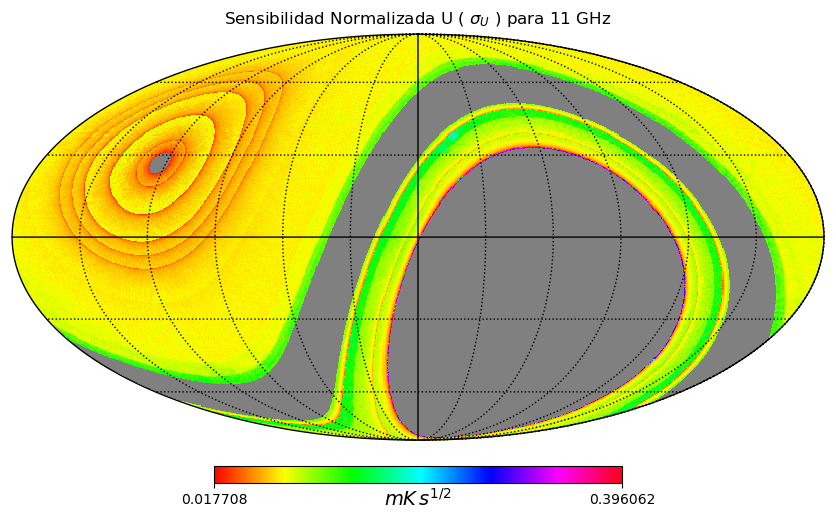

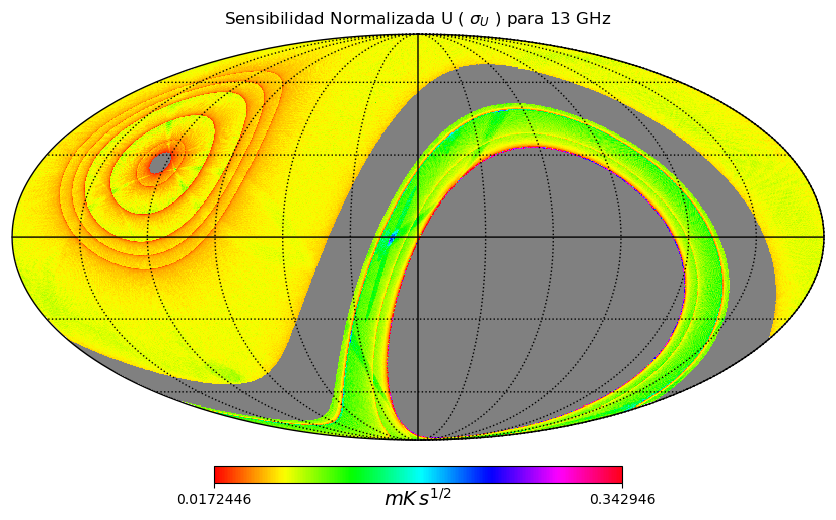

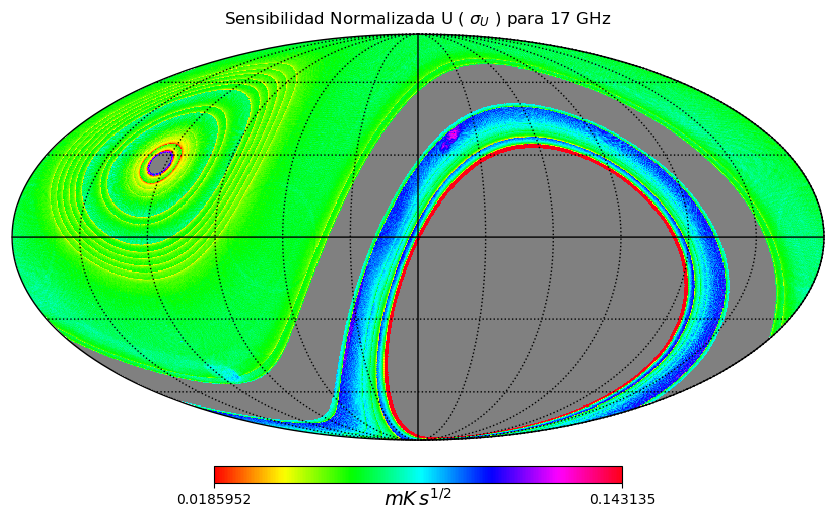

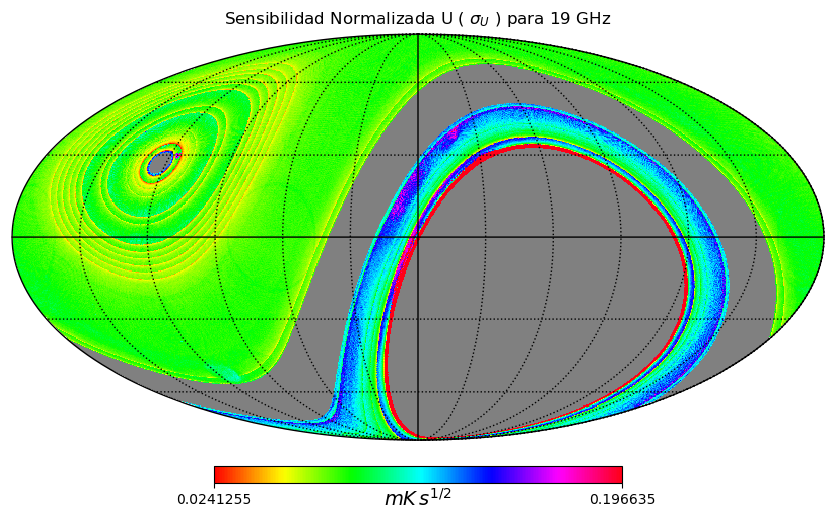

In [12]:
##############################################################################
# BLOQUE 2: SENSIBILIDAD NORMALIZADA PARA U
##############################################################################

def normsigU(sig0, hitsU):

    """Calcula la sensibilidad normalizada para U"""
    
    sigU = sig0 / np.sqrt(hitsU)
    return sigU

# Valores de sensibilidad característica (sig0U) para U

sig0U_values = {
    11: 1.372,                 # 11 GHz
    13: 1.188,                 # 13 GHz
    17: (1.875 + 1.100) / 2,   # 17 GHz => promedio H2, H4
    19: (2.273 + 1.064) / 2    # 19 GHz => promedio H2, H4
}

sensU_maps = {}  # Diccionario para los mapas de U

for freq in frecuencias:
    archivo = f"quijote_mfi_smth_skymap_{freq}ghz_512_dr1.fits"
    
    # Lectura de la sensibilidad característica para U

    sig0U = sig0U_values[freq]
    
    # Carga el mismo mapa de hits para Q/U

    hitsQU = hp.read_map(archivo, field=4)

    # Cálculo de la sensibilidad normalizada para U

    sigU_norm = normsigU(sig0U, hitsQU)
    
    # Guarda en el diccionario para cada iteracción (frecuencia)

    sensU_maps[freq] = sigU_norm

def plot_map_U(map_data, freq):
    hp.mollview(
        map_data, 
        title=f'Sensibilidad Normalizada U ( $\sigma_U$ ) para {freq} GHz',
        unit='$mK \, s^{1/2}$',
        cmap='hsv',
        min=min(map_data),
        max=max(map_data)/2
    )
    hp.graticule()
    plt.show()

for freq, map_data in sensU_maps.items():
    plot_map_U(map_data, freq)

Del mismo modo, seguimos el razonamiento anterior para la sensibilidad del parámetro de U. Esto se debe a que tiene el mismo número de hits que Q (ambos se miden a la vez) y las sensibilidades características no difieren demasiado entre sí.

/tmp/ipykernel_687/434468755.py:27: RuntimeWarning: overflow encountered in square
  denom = Q**2 + U**2  # Para evitar división por cero, se pueden enmascarar los píxeles con denom cercano a 0.


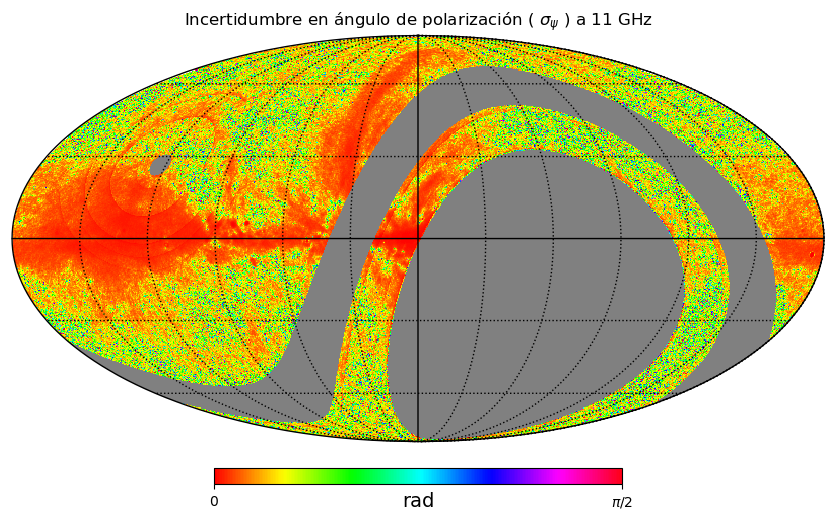

/tmp/ipykernel_687/434468755.py:27: RuntimeWarning: overflow encountered in square
  denom = Q**2 + U**2  # Para evitar división por cero, se pueden enmascarar los píxeles con denom cercano a 0.


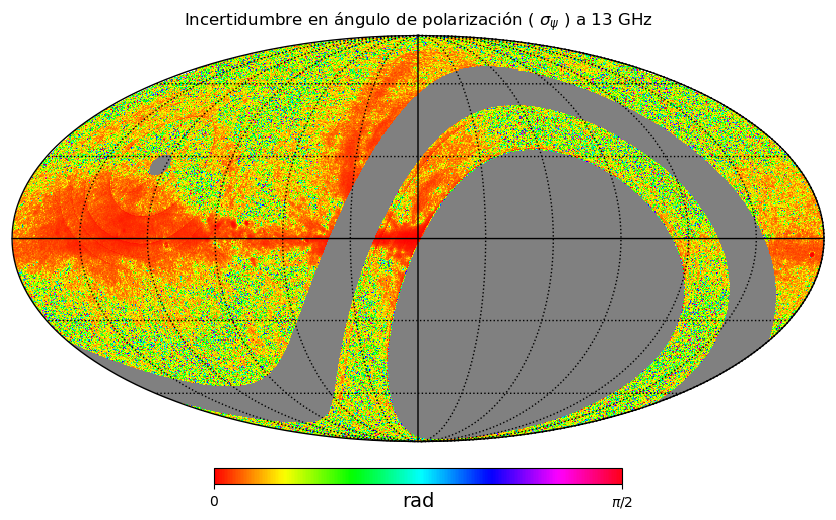

/tmp/ipykernel_687/434468755.py:27: RuntimeWarning: overflow encountered in square
  denom = Q**2 + U**2  # Para evitar división por cero, se pueden enmascarar los píxeles con denom cercano a 0.


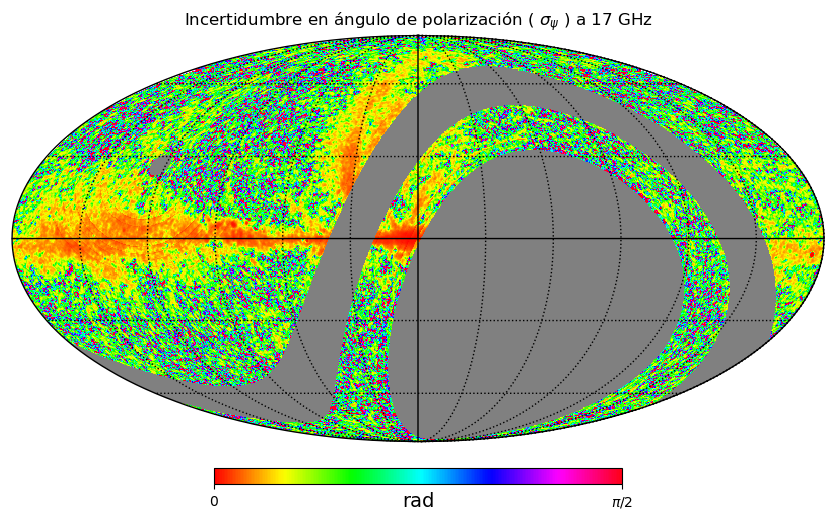

/tmp/ipykernel_687/434468755.py:27: RuntimeWarning: overflow encountered in square
  denom = Q**2 + U**2  # Para evitar división por cero, se pueden enmascarar los píxeles con denom cercano a 0.


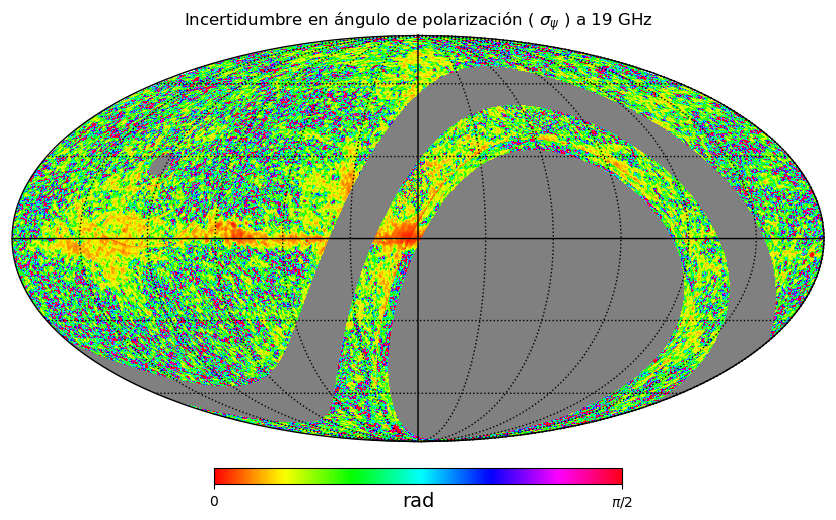

In [13]:
##############################################################################
# BLOQUE 3: PROPAGACIÓN DE ERROR DE LA FUNCIÓN DIFPSI
##############################################################################

def difpsi(Q, U):
    psi = 0.5 * np.arctan2(U, Q) + np.pi/2
    return psi

# Función para calcular la incertidumbre en psi (propagación de errores)

def difpsi_error(Q, U, sigma_Q, sigma_U):
    
    """
        Calcula σ₍ψ₎ para cada píxel, a partir de Q, U, σ_Q y σ_U.
        Para ello, aplicamos propagción de errores a la función difpsi(Q, U). 
        Es decir, calculamos la derivada de ψ respecto a Q y U, y luego aplicamos la fórmula de propagación de errores, que es:
            
            σ₍ψ₎ = sqrt( (∂ψ/∂U)² * σ_U² + (∂ψ/∂Q)² * σ_Q² )

        siendo la derivada de la arcotangente: ∂/∂x [arctan (A)] = (∂A/∂x) / (1 + A²)

        Calculada cada derivada parcial, finalmente nos queda:

             σ₍ψ₎ = sqrt( (0.5*Q/(Q^2+U^2))² * σ_U² + (0.5*U/(Q^2+U^2))² * σ_Q² ).

    """
    denom = Q**2 + U**2  # Para evitar división por cero, se pueden enmascarar los píxeles con denom cercano a 0.

    # Para evitar división por cero, se pueden enmascarar los píxeles con denom cercano a 0 usando np.where:

    """
        La función np.where es un condicional que nos facilita Numpy, tiene la siguiente estructura:
        np.where(condición, valor_si_verdadero, valor_si_falso)
        En este caso, si el denominador es diferente de cero, se calcula la derivada,
        de lo contrario se asigna 0 para evitar la división por cero.

    """

    dpsi_dU = 0.5 * np.where(denom!=0, Q/denom, 0)
    dpsi_dQ = 0.5 * np.where(denom!=0, -U/denom, 0)
    
    sigma_psi_sq = (dpsi_dU**2)*(sigma_U**2) + (dpsi_dQ**2)*(sigma_Q**2)
    sigma_psi = np.sqrt(sigma_psi_sq)
    return sigma_psi

# Bucle sobre las frecuencias para calcular y graficar ψ y su incertidumbre

for freq in frecuencias:
    archivo = f"quijote_mfi_smth_skymap_{freq}ghz_512_dr1.fits"
    
    # Lectura de los mapas de Q y U

    mapQ = hp.read_map(archivo, field=1)
    mapU = hp.read_map(archivo, field=2)
    
    # Cálculo de psi

    psi = difpsi(mapQ, mapU)
    
    ########### --- ESTIMACIÓN DE LOS ERRORES EN Q y U --- ###########

    sigma_Q = sensQ_maps[freq]  # Sensibilidad normalizada para Q
    sigma_U = sensU_maps[freq]  # Sensibilidad normalizada para U
    
    # -----------------------------------------
    
    # Cálculo de la incertidumbre en psi

    sigma_psi = difpsi_error(mapQ, mapU, sigma_Q, sigma_U)

    # Visualización del mapa de la incertidumbre en psi

    hp.mollview(sigma_psi,
                title=f"Incertidumbre en ángulo de polarización ( $\sigma_\psi$ ) a {freq} GHz",
                unit="rad",
                cmap="hsv",
                min=0,max=np.pi/2)  
    hp.graticule()

    # Cambiar los ticks de la barra de color
    fig = plt.gcf()
    cb = fig.axes[-1]  # healpy mollview pone la colorbar en el último eje
    cb.set_xticks([0, np.pi/2])
    cb.set_xticklabels([r"$0$", r"$\pi/2$"])

    plt.show()

/tmp/ipykernel_687/434468755.py:27: RuntimeWarning: overflow encountered in square
  denom = Q**2 + U**2  # Para evitar división por cero, se pueden enmascarar los píxeles con denom cercano a 0.


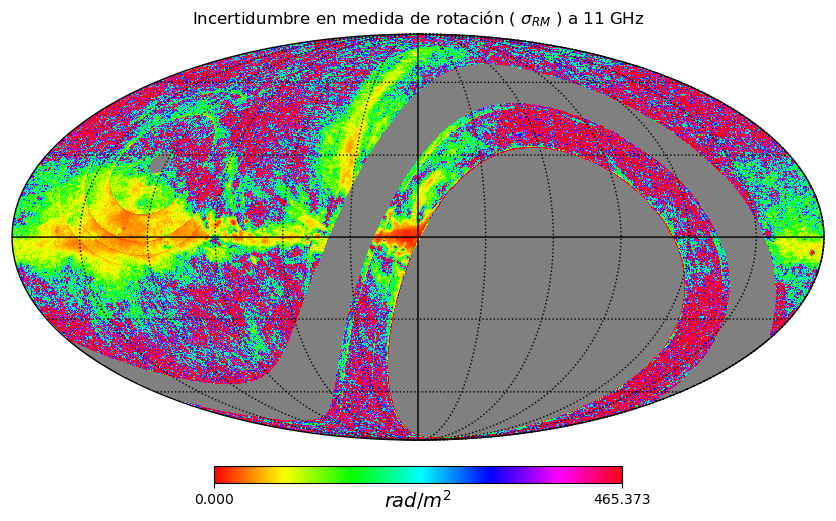

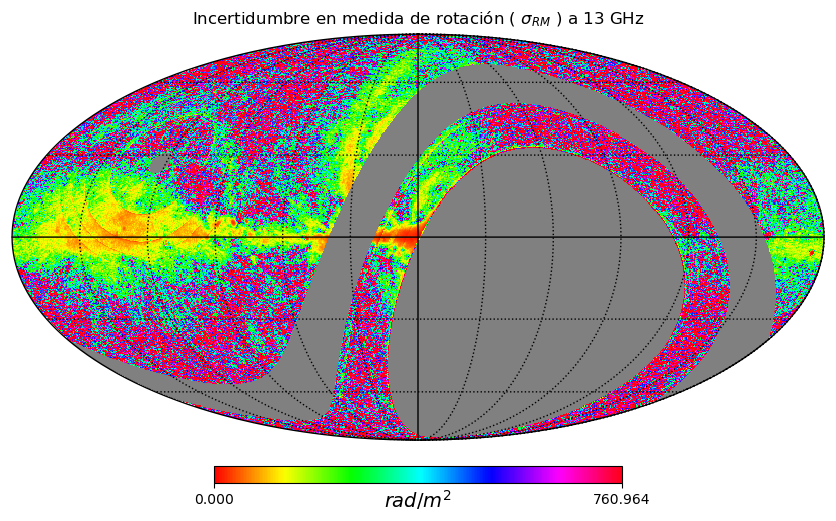

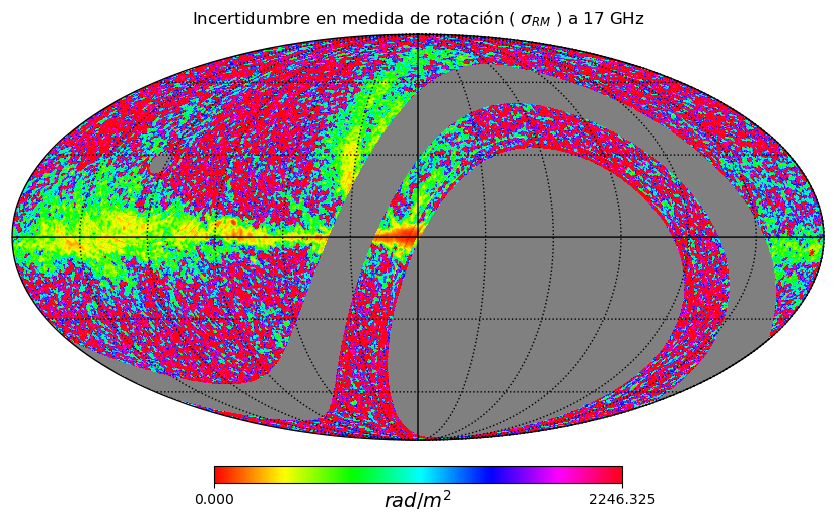

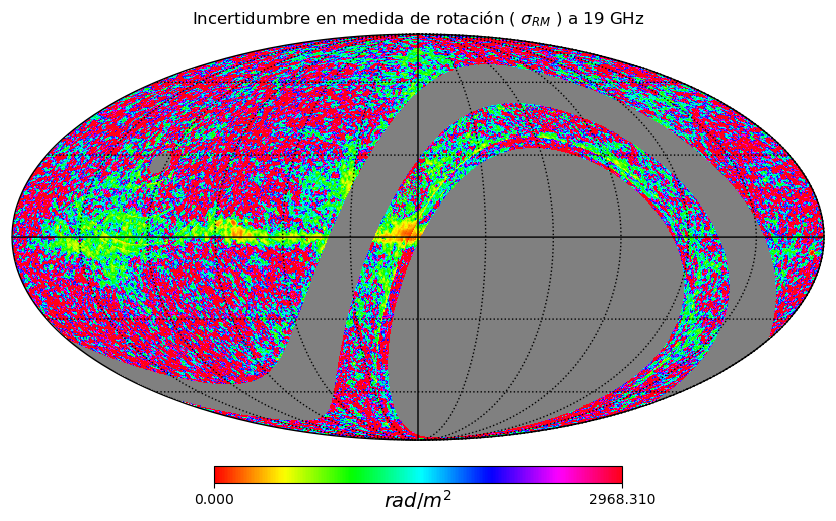

In [14]:
##############################################################################
# BLOQUE 4: PROPAGACIÓN DE ERROR DE LA FUNCIÓN ROTATIONMEASURE
##############################################################################

# Velocidad de la luz en m/s (valor exacto según CODATA)

velocidad_luz = 299792458.0

# Función original para calcular RM

def rotationmeasure(psi, freq_ghz):
    freq_hz = freq_ghz * 1e9       # de GHz a Hz
    RM = (psi * (freq_hz**2)) / (velocidad_luz**2)
    return RM
    
# Función para calcular la incertidumbre en RM (propagación de errores)

def rotationmeasure_error(sigma_psi, freq_ghz):

    """
    sigma_RM = (ν²/c²) · sigma_psi,
    donde ν se pasa en GHz y se convierte a Hz.
    
    """
    freq_hz = freq_ghz * 1e9
    alpha = (freq_hz**2) / (velocidad_luz**2)
    sigma_RM = alpha * sigma_psi
    return sigma_RM

# Bucle sobre las frecuencias para calcular y graficar RM y su incertidumbre

for freq in frecuencias:
    archivo = f"quijote_mfi_smth_skymap_{freq}ghz_512_dr1.fits"

    # Lectura de los mapas de Q y U

    mapQ = hp.read_map(archivo, field=1)
    mapU = hp.read_map(archivo, field=2)

    # Cálculo de psi

    psi = difpsi(mapQ, mapU)
    
    ########### --- ESTIMACIÓN DE LOS ERRORES EN Q y U --- ###########

    sigma_Q = sensQ_maps[freq]  # Sensibilidad normalizada para Q
    sigma_U = sensU_maps[freq]  # Sensibilidad normalizada para U
    
    # -----------------------------------------

    # Cálculo de la incertidumbre en psi

    sigma_psi = difpsi_error(mapQ, mapU, sigma_Q, sigma_U)

    # Cálculo de la medida de rotación RM y su error sigma_RM

    RM = rotationmeasure(psi, freq)
    sigma_RM = rotationmeasure_error(sigma_psi, freq)
    
    # Visualización del mapa de la incertidumbre en RM
    
    hp.mollview(sigma_RM,
                title=r"Incertidumbre en medida de rotación ( $\sigma_{RM}$ ) " f"a {freq} GHz",
                unit="$rad/m^2$",
                cmap="hsv",
                format="%.3f",
                min=0,max=max(sigma_RM)/1000)  # Como el máximo es del orden del millón, bajamos tres órdenes de magnitud para reducir la escala.
    hp.graticule()
    plt.show()

/tmp/ipykernel_687/434468755.py:27: RuntimeWarning: overflow encountered in square
  denom = Q**2 + U**2  # Para evitar división por cero, se pueden enmascarar los píxeles con denom cercano a 0.


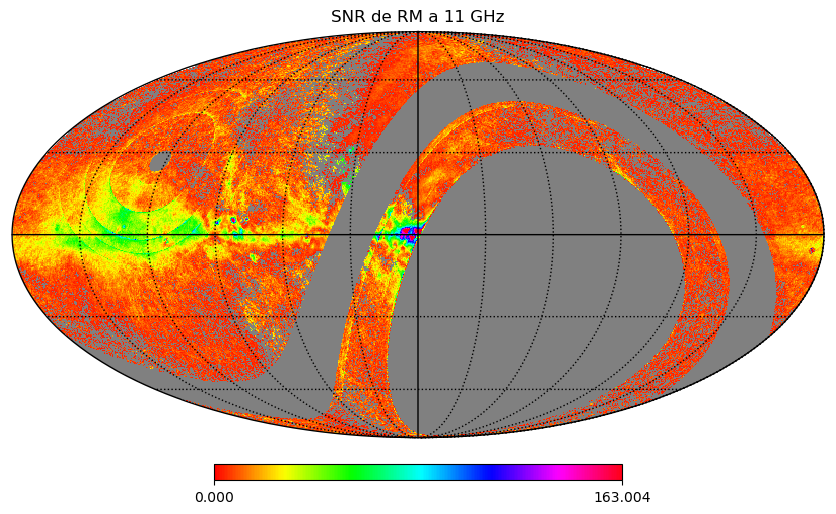

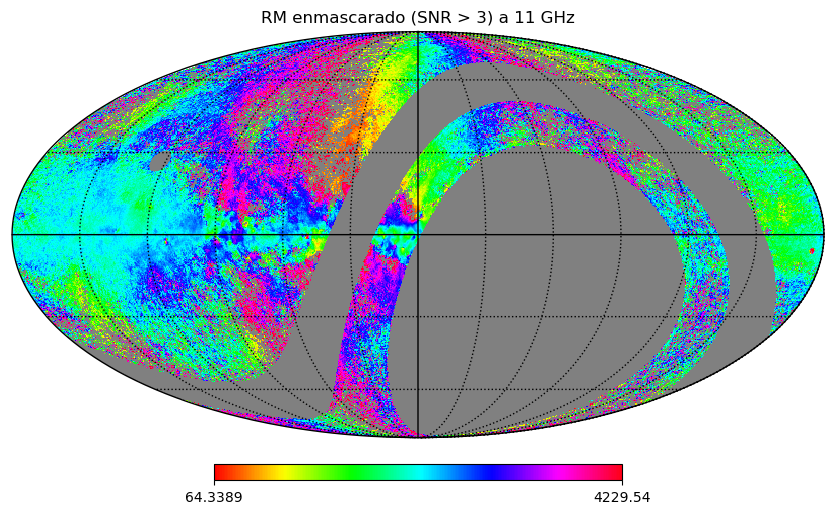

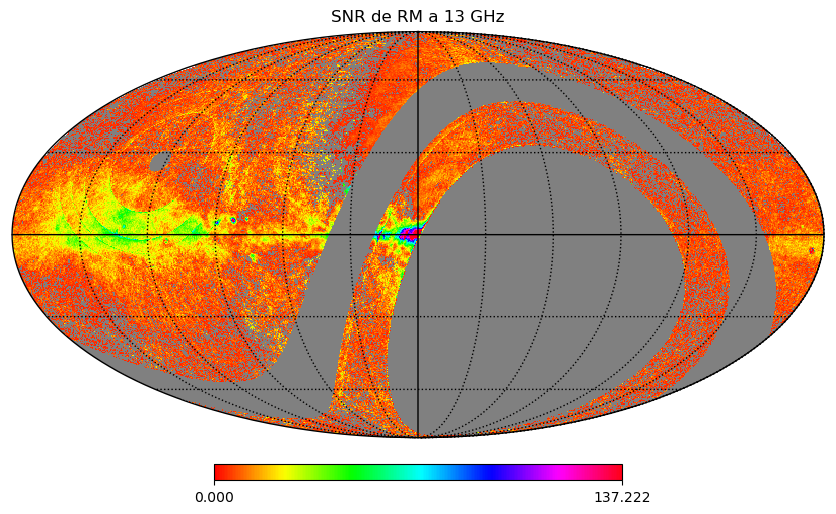

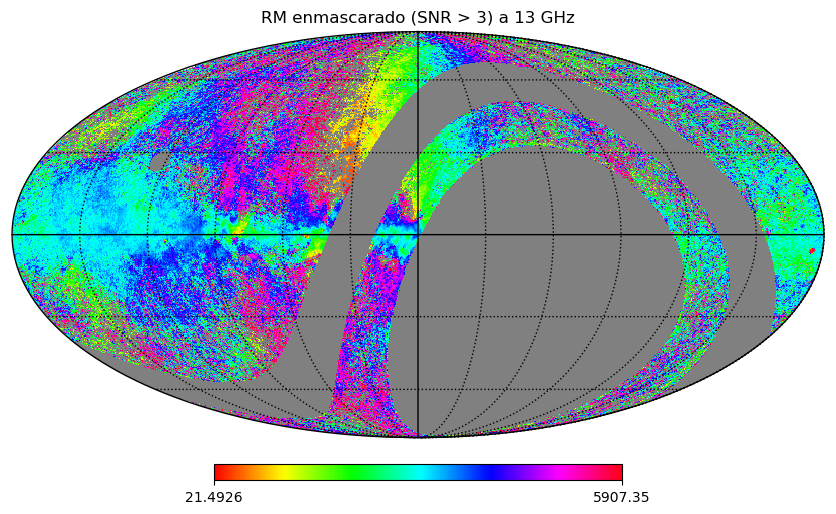

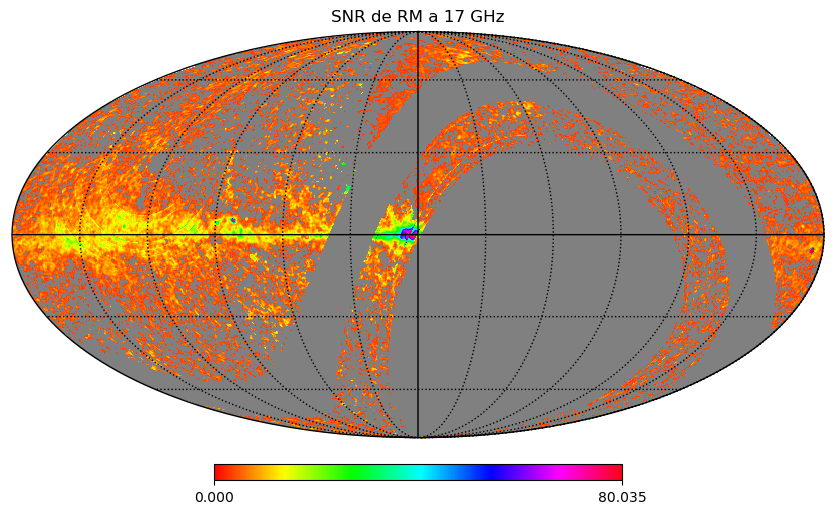

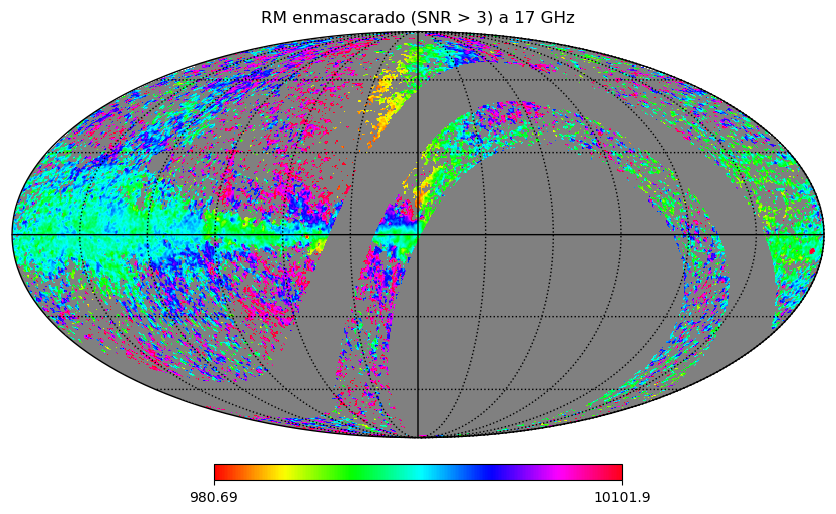

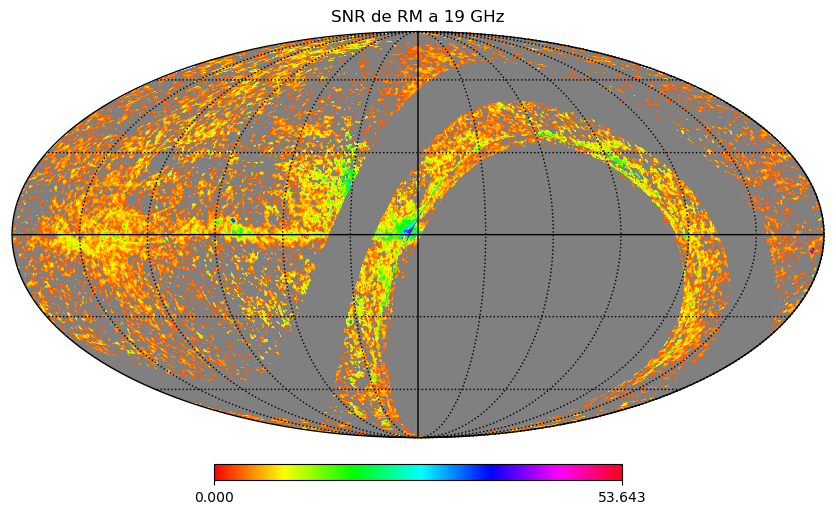

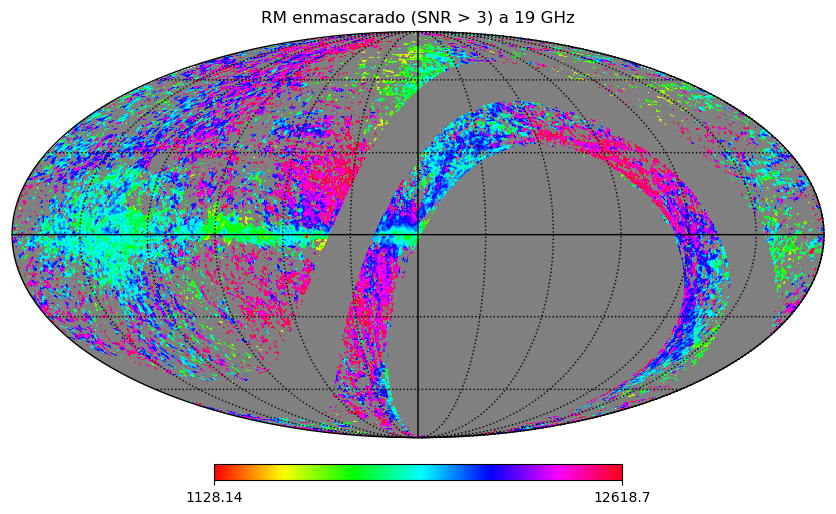

In [15]:
##############################################################################
# BLOQUE 5: OBTENCIÓN DEL SNR (SIGNAL TO NOISE RATIO)
##############################################################################

for freq in frecuencias:
    archivo = f"quijote_mfi_smth_skymap_{freq}ghz_512_dr1.fits"

    # Lectura de los mapas de Q y U

    mapQ = hp.read_map(archivo, field=1)
    mapU = hp.read_map(archivo, field=2)

    # Cálculo de psi

    psi = difpsi(mapQ, mapU)
    
    ########### --- ESTIMACIÓN DE LOS ERRORES EN Q y U --- ###########

    sigma_Q = sensQ_maps[freq]  # Sensibilidad normalizada para Q
    sigma_U = sensU_maps[freq]  # Sensibilidad normalizada para U
    
    # -----------------------------------------

    # Cálculo de la incertidumbre en psi

    sigma_psi = difpsi_error(mapQ, mapU, sigma_Q, sigma_U)

    # Cálculo de la medida de rotación RM y su error sigma_RM

    RM = rotationmeasure(psi, freq)
    sigma_RM = rotationmeasure_error(sigma_psi, freq)

    # Cálculo de SNR

    SNR_map = np.full_like(RM, hp.UNSEEN)

    """
        La función np.full_like crea un nuevo array con la misma forma y tipo de datos que el array de entrada (RM),
        y lo llena con el valor hp.UNSEEN. Esto es útil para inicializar un mapa de SNR con valores no visibles (hp.UNSEEN)
        y luego se llenará con los valores de SNR calculados.

    """
    mask = sigma_RM > 0

    """
        Creamos una máscara booleana que indica dónde sigma_RM es mayor que 0.
        Esto es importante porque solo queremos calcular el SNR en los píxeles donde sigma_RM tiene un valor válido, evitando así
        divisiones por cero o valores no definidos.

    """

    SNR_map[mask] = RM[mask] / sigma_RM[mask]

    # Creación de mapa de RM enmascarado por SNR

    umbral_snr = 3  # Cota inferior de SNR
    RM_masked = np.where(SNR_map > umbral_snr, RM, hp.UNSEEN)
    SNR_masked = np.where(SNR_map > umbral_snr, SNR_map, hp.UNSEEN)
    # Visualización del mapa de SNR

    hp.mollview(SNR_masked,
                title=f"SNR de RM a {freq} GHz",
                cmap="hsv",
                format="%.3f",
                min=0,max=max(SNR_masked)/10) # Como el máximo es del orden de mil, bajamos un orden.
    hp.graticule()
    plt.show()

    # Visualización del mapa de RM enmascarado
    
    hp.mollview(RM_masked, 
                title=f"RM enmascarado (SNR > {umbral_snr}) a {freq} GHz",
                cmap="hsv")
                #min=np.percentile(RM_masked[RM_masked != hp.UNSEEN], 5),max=np.percentile(RM_masked[RM_masked != hp.UNSEEN], 95))
    hp.graticule()
    plt.show()